# Analysis of scRNA-seq Data Comparing Non Small Cell Lung Cancer to Normal

Here I analyze single cell RNA-sequencing (scRNA-seq) data from 32 samples over 5 biological conditions: lung adenocarcinoma (treated and untreated), lung squamous cell carcinoma (treated and untreated), and normal adjacent cells.

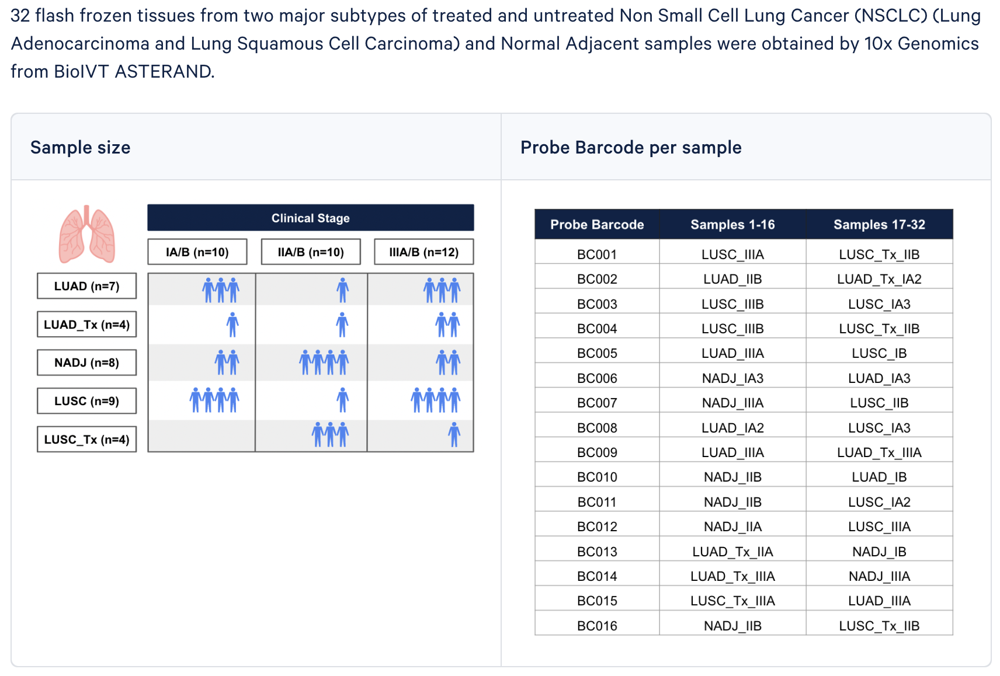

In [1]:
# load packages
library(dplyr)
library(Seurat)
library(SeuratObject)
library(SeuratDisk)
library(BPCells)
library(Azimuth)
library(future)

library(DESeq2)

library(pheatmap)
library(RColorBrewer)
library(ggplot2)
library(EnhancedVolcano)

# change the current plan to access parallelization
plan("multisession", workers = availableCores())
plan()

# increase size of plots from default
options(repr.plot.width = 14, 
        repr.plot.height = 14) # from 7, 7


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat



Attaching shinyBS


Attaching package: 'Azimuth'


The following object is masked from 'package:SeuratDisk':

    Connect


Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: 'BiocGenerics'


The following object is masked from 'package:BPCells':

    as.data.frame


The following object is masked from 'package:SeuratObject':

    intersect


The following objects are masked from 'package:dplyr':

    combine, intersect, setdiff, un

multisession:
- args: function (..., workers = c(system = 12), envir = parent.frame())
- tweaked: TRUE
- call: plan("multisession", workers = availableCores())

In [6]:
# load data from h5 file
file_path <- "data/16plex_900k_32_NSCLC_multiplex_count_filtered_feature_bc_matrix.h5"
nsclc_data <- open_matrix_10x_hdf5(
    path = file_path
)

# Write the matrix to a directory
mat_dir <- "data/nsclc_counts"
write_matrix_dir(
    mat = nsclc_data, 
    dir = mat_dir)

# Now that we have the matrix on disk, we can load it
nsclc_mat <- open_matrix_dir(dir = mat_dir)
nsclc_mat <- Azimuth:::ConvertEnsembleToSymbol(mat = nsclc_mat, 
                                               species = "human")

# Create Seurat Object
nsclc <- CreateSeuratObject(counts = nsclc_mat)

18082 x 897733 IterableMatrix object with class MatrixDir

Row names: ENSG00000187634, ENSG00000188976 ... ENSG00000198727
Col names: AAACAAGCAAACGGTCACTTTAGG-1, AAACAAGCAATAAGGAACTTTAGG-1 ... TTTGTGAGTGGATGGTATTCGGTT-128

Data type: uint32_t
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /home/fmbuga/scrna/projects/nsclc_10x_900k/data/nsclc_counts


Attaching package: 'dplyr'


The following object is masked from 'package:biomaRt':

    select


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



Batch submitting query [=======>-----------------------]  25% eta: 10s

Batch submitting query [===============>---------------]  50% eta:  8s

Batch submitting query [======================>--------]  75% eta:  4s
                                                                      



In [2]:
# Now that we have the matrix on disk, we can load it
mat_dir <- "data/nsclc_counts"
nsclc_mat <- open_matrix_dir(dir = mat_dir)
nsclc_mat <- Azimuth:::ConvertEnsembleToSymbol(mat = nsclc_mat, 
                                               species = "human")

# Create Seurat Object
(nsclc <- CreateSeuratObject(counts = nsclc_mat))

An object of class Seurat 
18037 features across 897733 samples within 1 assay 
Active assay: RNA (18037 features, 0 variable features)
 1 layer present: counts

## add sample metadata

In [4]:
nsclc[['sample']] <- as.integer(sub('.*-', '', colnames(nsclc)))
sample_table <- read.csv('data/16plex_900k_32_NSCLC_multiplex_aggregation.csv')
sample_table$sample <- (1:nrow(sample_table))
nsclc[[]] <- merge(nsclc[[]], sample_table, by = "sample", all.x = TRUE)
nsclc[[]]

,orig.ident,nCount_RNA,nFeature_RNA,sample,sample_id,molecule_h5,description,disease.state,clinical.stage
,<fct>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACAAGCAAACGGTCACTTTAGG-1,SeuratProject,14792,5177,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACAAGCAATAAGGAACTTTAGG-1,SeuratProject,2067,1464,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACAAGCAGCACTAAACTTTAGG-1,SeuratProject,4371,2515,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACAAGCATCGATAGACTTTAGG-1,SeuratProject,8413,3827,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACCAATCCGAAAGTACTTTAGG-1,SeuratProject,2460,1232,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACCAATCCTCAAGCACTTTAGG-1,SeuratProject,1261,953,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACCAATCGATATAGACTTTAGG-1,SeuratProject,547,469,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACCAGGTATTGGGAACTTTAGG-1,SeuratProject,1802,971,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA
AAACCAGGTGACATTCACTTTAGG-1,SeuratProject,2949,1740,1,16plex_NSCLC_1_16_multiplex_Rep1_1,/path/to/runs/16plex_NSCLC_1_16_multiplex_Rep1/outs/per_sample_outs/LUSC_IIIA_BC1/count/sample_molecule_info.h5,LUSC_IIIA_BC1,LUSC,IIIA


## QC

In [5]:
# mitochondrial counts to metadata
nsclc[["percent.mt"]] <- PercentageFeatureSet(nsclc, pattern = "^MT-")
summary(nsclc[["percent.mt"]])

   percent.mt     
 Min.   : 0.0000  
 1st Qu.: 0.1459  
 Median : 0.5726  
 Mean   : 1.1015  
 3rd Qu.: 1.3354  
 Max.   :94.6472  

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."


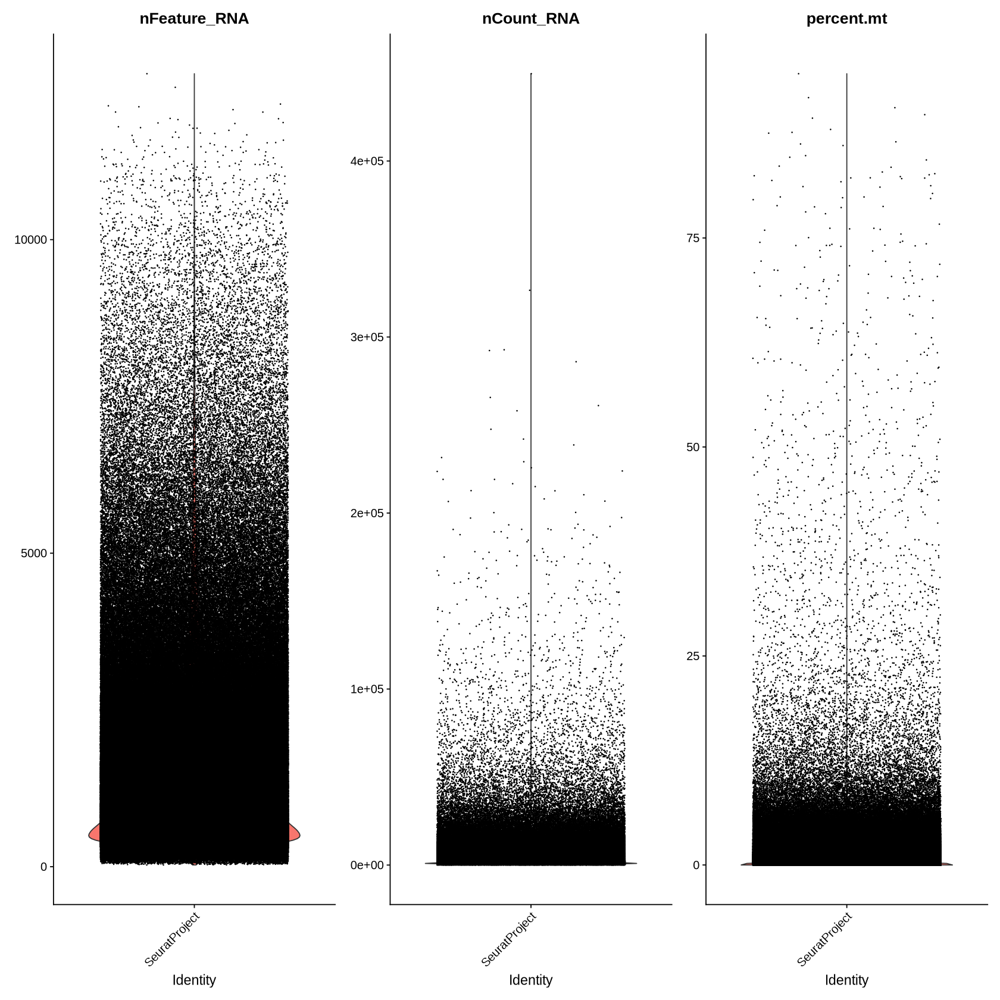

In [6]:
# Visualize QC metrics as a violin plot
VlnPlot(nsclc, 
        features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), 
        ncol = 3)

In [7]:
summary(nsclc[[c("nFeature_RNA", "nCount_RNA", "percent.mt")]])

  nFeature_RNA     nCount_RNA       percent.mt     
 Min.   :   28   Min.   :    45   Min.   : 0.0000  
 1st Qu.:  626   1st Qu.:   800   1st Qu.: 0.1459  
 Median : 1051   Median :  1510   Median : 0.5726  
 Mean   : 1450   Mean   :  3072   Mean   : 1.1015  
 3rd Qu.: 1761   3rd Qu.:  2987   3rd Qu.: 1.3354  
 Max.   :12646   Max.   :449595   Max.   :94.6472  

In [8]:
# filter out cells with too low/high counts, too high mitochondrial counts, too many/few genes
nsclc
nsclc <- subset(nsclc, 
                subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & 
                            percent.mt < 5 & 
                            nCount_RNA > 600 & nCount_RNA < 6000)
nsclc
summary(nsclc[[c("nFeature_RNA", "nCount_RNA", "percent.mt")]])

An object of class Seurat 
18037 features across 897733 samples within 1 assay 
Active assay: RNA (18037 features, 0 variable features)
 1 layer present: counts

An object of class Seurat 
18037 features across 619727 samples within 1 assay 
Active assay: RNA (18037 features, 0 variable features)
 1 layer present: counts

  nFeature_RNA    nCount_RNA     percent.mt     
 Min.   : 201   Min.   : 601   Min.   :0.00000  
 1st Qu.: 749   1st Qu.: 987   1st Qu.:0.09719  
 Median :1063   Median :1532   Median :0.43732  
 Mean   :1170   Mean   :1832   Mean   :0.78538  
 3rd Qu.:1507   3rd Qu.:2421   3rd Qu.:1.13821  
 Max.   :2499   Max.   :5999   Max.   :4.99802  

The filtering step leaves us with about 620,000 cells.

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."


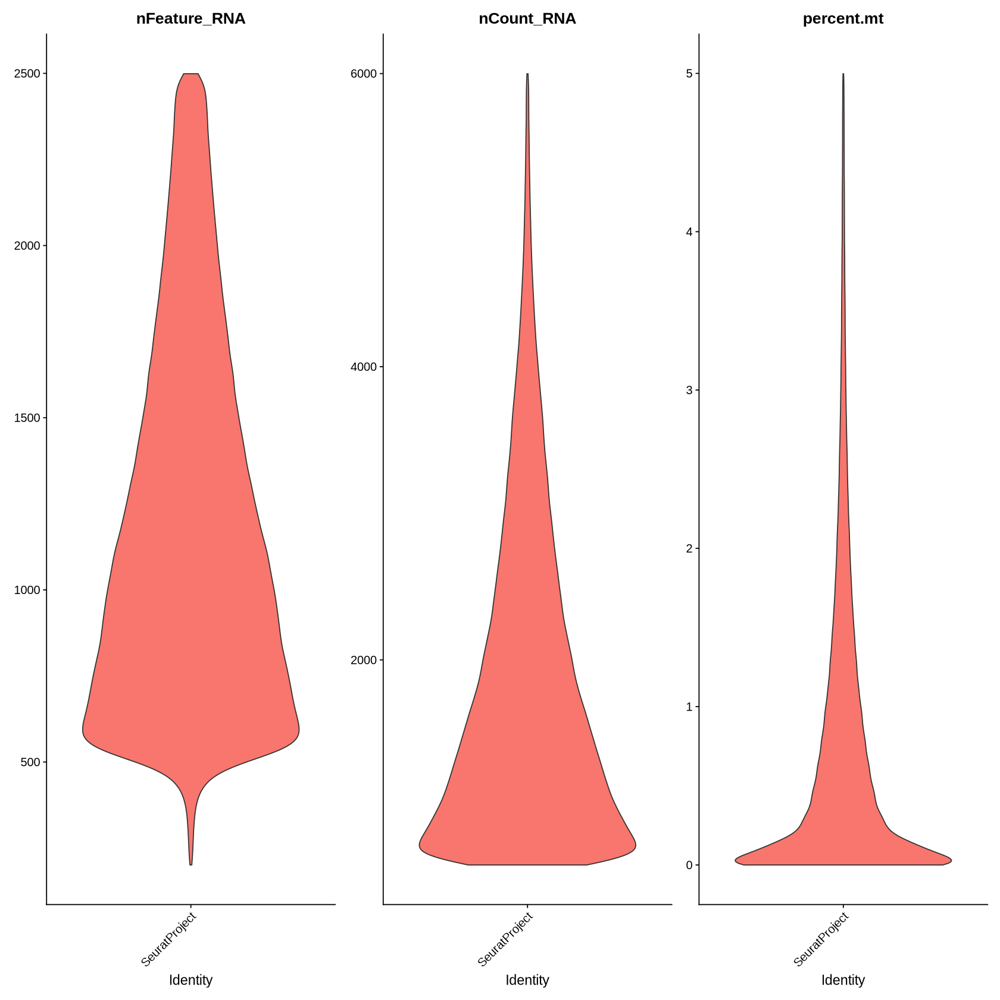

In [9]:
# visualize QC metrics post-filter
VlnPlot(nsclc, 
        features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), 
        alpha = 0,
        ncol = 3)

## data normalization, selection of highly variable genes, data scaling, dimension reduction, clustering, and visualization

Next, we normalize the data, select highly variable features, and scale the data using the `SCTransform` method.

We then cluster the data and visualize using UMAP.

This is submitted as a SLURM job to the HPC.

In [3]:
# SLURM submission script
file_to_read <- "~/tools/slurm_scripts/Rscript_submit_himem_1node_12cpus_mem500_231125_slurm.sh"
file_content <- readLines(file_to_read)
cat(file_content, sep = "\n")

#!/bin/bash
#
#SBATCH --job-name=Rscript_submit_himem_1node_12cpus_mem500_231125
#SBATCH --output=/home/fmbuga/tools/slurm_scripts/slurm_out_err/Rscript_submit_himem_1node_12cpus_mem500_231125_%j.out
#SBATCH --error=/home/fmbuga/tools/slurm_scripts/slurm_out_err/Rscript_submit_himem_1node_12cpus_mem500_231125_%j.err
#
#SBATCH --ntasks=1
#SBATCH --cpus-per-task=12
#SBATCH --mem=500G
#SBATCH --partition=himem


datenow=$(date)
echo $datenow
srun hostname

start=$(date +%s)
echo "start time: $start"
echo $HOSTNAME


eval "$(conda shell.bash hook)"
conda activate seurat5
echo ""
conda info
echo ""
conda list
echo ""

echo ""
echo "Path to R used: "
which R
R --version


###

killall R

Rscript \
    --save \
    --verbose \
    $1 \
    $2 \
    $3 \
    $4

###

echo ""
srun hostname


echo ""
end=$(date +%s)
echo "end time: $end"
runtime_s=$(echo $(( end - start )))
echo "total run time(s): $runtime_s"
sec_per_min=60
sec_per_hr=3600
runtime_m=$(echo "scale=2; $runtime_s / $sec_per_min;" 

In [2]:
# R script for data normalization, selection of highly variable genes, data scaling, dimension reduction, clustering, and visualization
file_to_read <- "~/tools/R_scripts/scrnaseq_sctransform_to_umap_231127.r"
file_content <- readLines(file_to_read)
cat(file_content, sep = "\n")

# clear workspace
rm(list = ls())
gc()

args <- commandArgs(TRUE) # to access command line arguments
print(args)

############################################################################################################################################################


work_dir <- args[1]                                                                                                  ### WORKING/OUTPUT DIRECTORY
filename <- paste('scrnaseq_sctransform_to_umap_231127', system("date '+_%Y_%m_%d_%H_%M_%S'", intern=TRUE), '.rds', sep = '')   ### OUTPUT FILENAME

# load packages
library(BPCells)
library(Seurat)
library(SeuratObject)
library(SeuratDisk)
library(Azimuth)
library(future)
library(dplyr)

options(future.globals.maxSize = 16e+09) # 16G

# change the current plan to access parallelization
plan("multisession", workers = availableCores())
plan()

# load data
cat(paste('\n', system("date", intern=TRUE), '---> loading data...', '\n'))
setwd(work_dir)
filename <- "nsclc_2023_11_27_0

In [2]:
# load Seurat object output by SLURM submission
filename <- 'nsclc_2023_11_27_08_03_25.rds'
nsclc <- readRDS(filename)
nsclc

An object of class Seurat 
35488 features across 619727 samples within 2 assays 
Active assay: SCT (17451 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

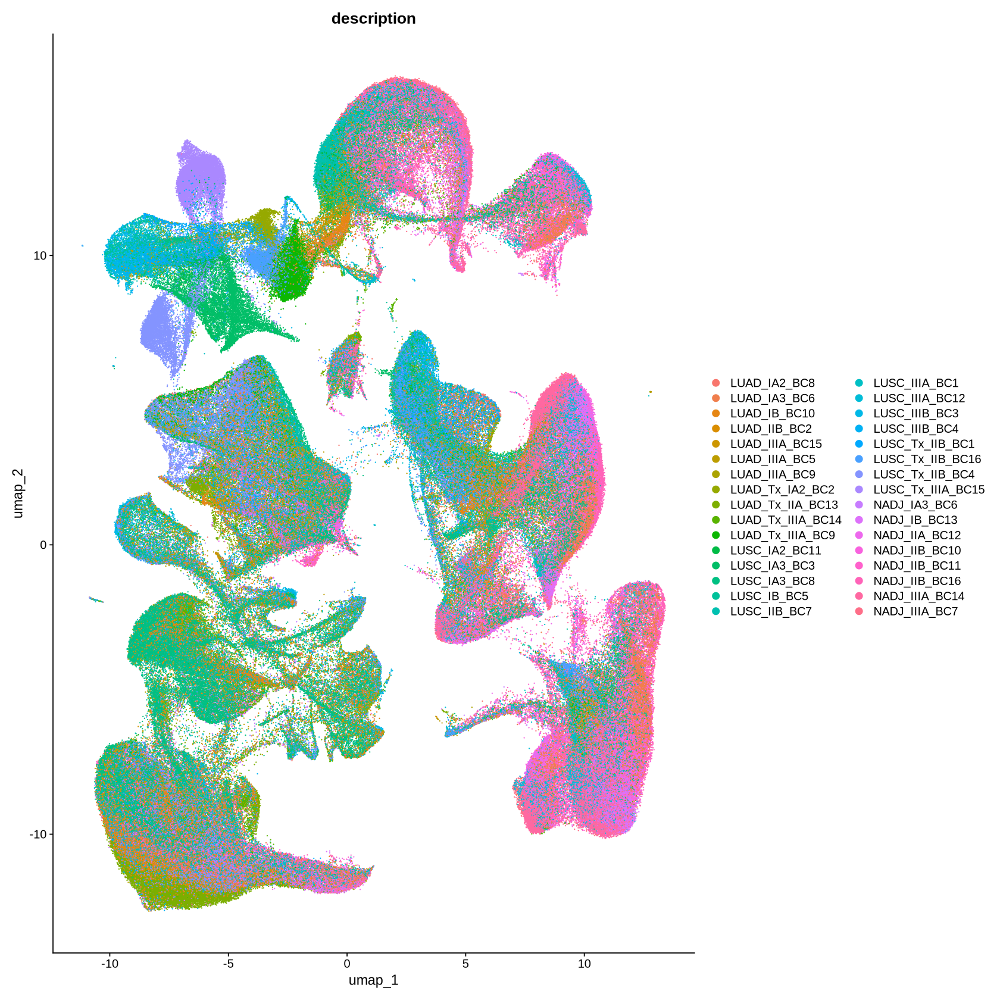

In [3]:
# visualize UMAP and group by the 32 samples of origin
print(
DimPlot(nsclc, reduction = "umap", 
        group.by = c('description'),
       raster = FALSE)
    )

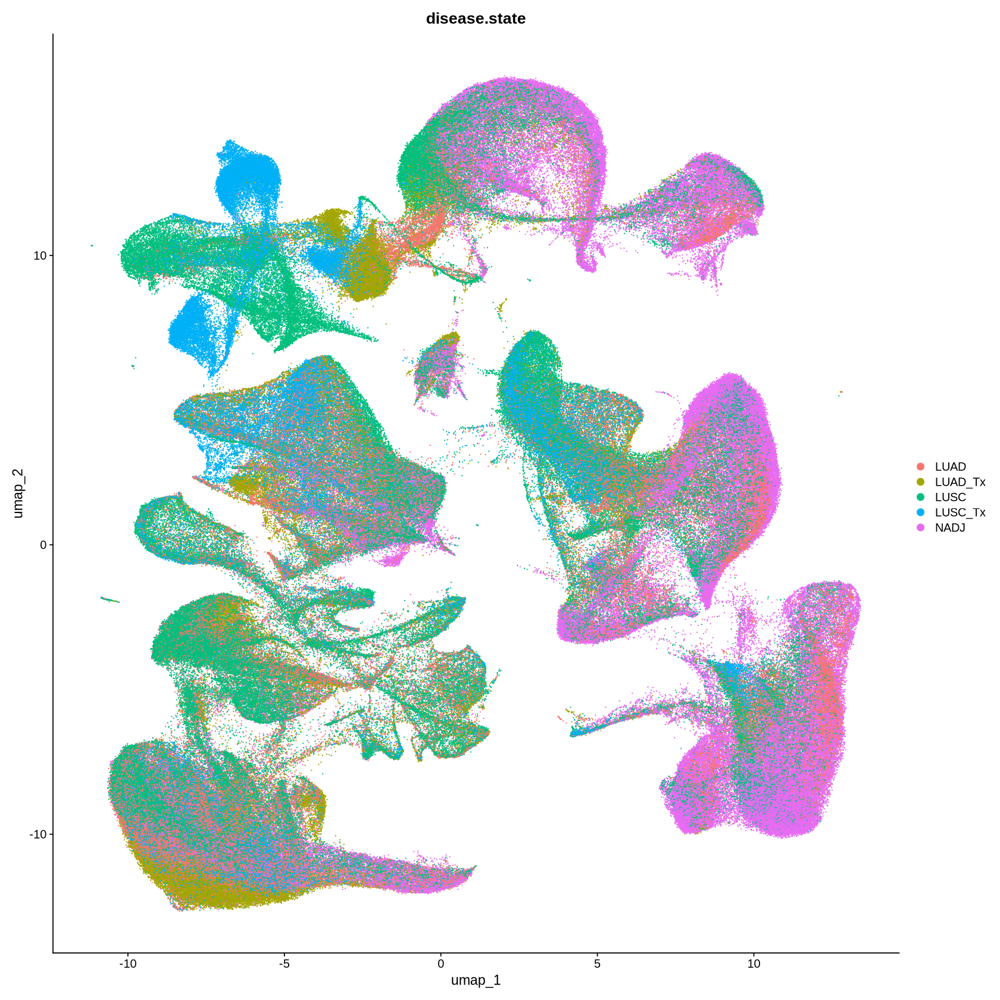

In [4]:
# visualize UMAP and group by the 5 biological states
print(
DimPlot(nsclc, reduction = "umap", 
        group.by = c('disease.state'), 
       raster = FALSE)
    )

## cell annotation

We then use Azimuth to annotate the cells using the Human Lung Cell Atlas as a reference.

This is also submitted as a SLURM job to the HPC.

In [3]:
# R script for Azimuth cell annotation using the Human Lung Cell Atlas as a reference
file_to_read <- "~/tools/R_scripts/scrnaseq_run_azimuth_231128.r"
file_content <- readLines(file_to_read)
cat(file_content, sep = "\n")

# clear workspace
rm(list = ls())
gc()

args <- commandArgs(TRUE) # to access command line arguments
print(args)

############################################################################################################################################################


work_dir <- args[1]                                                                                                            ### WORKING/OUTPUT DIRECTORY
input_filename <- "nsclc_2023_11_27_08_03_25.rds"                                                                              ### INPUT FILENAME
output_filename <- paste('scrnaseq_run_azimuth_231128', system("date '+_%Y_%m_%d_%H_%M_%S'", intern=TRUE), '.rds', sep = '')   ### OUTPUT FILENAME

# load packages
library(BPCells)
library(Seurat)
library(SeuratObject)
library(SeuratDisk)
library(Azimuth)
library(SeuratData)
library(future)
library(dplyr)

options(future.globals.maxSize = 16e+09) # 16G

# change the current plan to access parallelization
plan("multisessio

In [6]:
# read Azimuth annotated rds
nsclc <- readRDS('scrnaseq_run_azimuth_231128_2023_11_28_11_01_02.rds')
nsclc

An object of class Seurat 
35638 features across 619727 samples within 8 assays 
Active assay: SCT (17451 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 7 other assays present: RNA, prediction.score.ann_level_1, prediction.score.ann_level_2, prediction.score.ann_level_3, prediction.score.ann_level_4, prediction.score.ann_level_5, prediction.score.ann_finest_level
 4 dimensional reductions calculated: pca, umap, integrated_dr, ref.umap

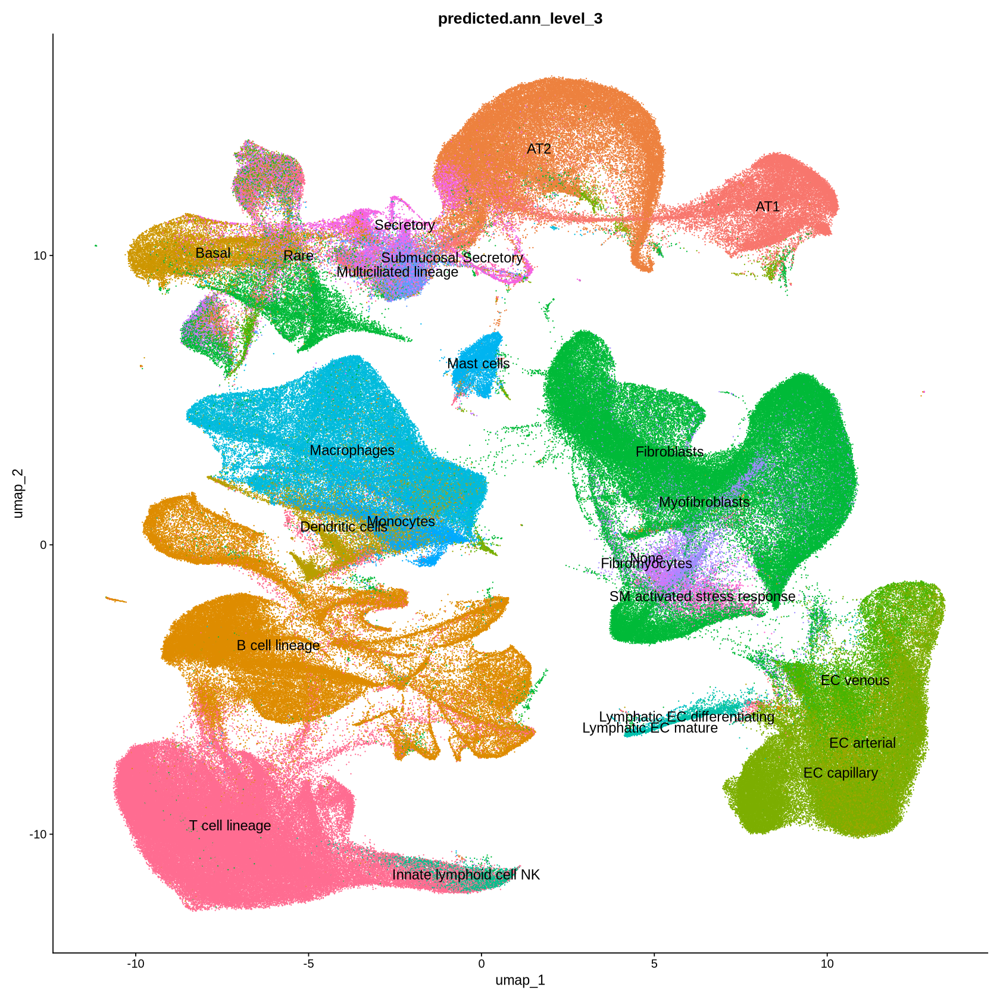

In [7]:
# visualization of Azimuth-annotated data
print(
DimPlot(nsclc, group.by = "predicted.ann_level_3", 
        label = TRUE, label.size = 5, 
        raster = FALSE)  + NoLegend()
    )

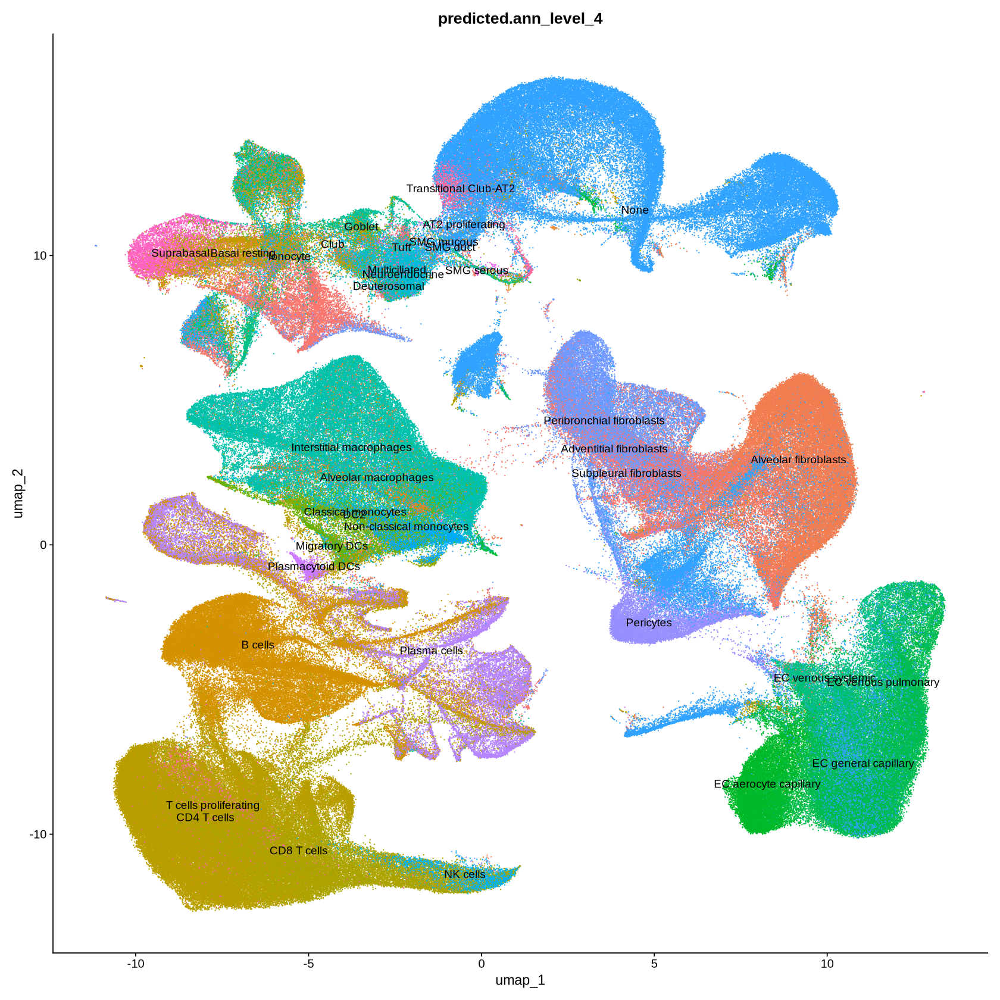

In [8]:
# visualization of Azimuth-annotated data
print(
DimPlot(nsclc, group.by = "predicted.ann_level_4", 
        label = TRUE, label.size = 4, 
        raster = FALSE)  + NoLegend()
    )

## pseudobulk analysis

We can then carry out a pseudobulk analysis where we compare all cells by donor or even specific annotated cell types by donor.

In [11]:
# pseudobulk by donor
bulk_by_donor <- AggregateExpression(nsclc, return.seurat = TRUE, 
                                     assays = "RNA", 
                                     group.by = "description")
Cells(bulk_by_donor)

Names of identity class contain underscores ('_'), replacing with dashes ('-')
This message is displayed once every 8 hours.


[1] "LUAD-IA2-BC8"      "LUAD-IA3-BC6"      "LUAD-IB-BC10"     
 [4] "LUAD-IIB-BC2"      "LUAD-IIIA-BC15"    "LUAD-IIIA-BC5"    
 [7] "LUAD-IIIA-BC9"     "LUAD-Tx-IA2-BC2"   "LUAD-Tx-IIA-BC13" 
[10] "LUAD-Tx-IIIA-BC14" "LUAD-Tx-IIIA-BC9"  "LUSC-IA2-BC11"    
[13] "LUSC-IA3-BC3"      "LUSC-IA3-BC8"      "LUSC-IB-BC5"      
[16] "LUSC-IIB-BC7"      "LUSC-IIIA-BC1"     "LUSC-IIIA-BC12"   
[19] "LUSC-IIIB-BC3"     "LUSC-IIIB-BC4"     "LUSC-Tx-IIB-BC1"  
[22] "LUSC-Tx-IIB-BC16"  "LUSC-Tx-IIB-BC4"   "LUSC-Tx-IIIA-BC15"
[25] "NADJ-IA3-BC6"      "NADJ-IB-BC13"      "NADJ-IIA-BC12"    
[28] "NADJ-IIB-BC10"     "NADJ-IIB-BC11"     "NADJ-IIB-BC16"    
[31] "NADJ-IIIA-BC14"    "NADJ-IIIA-BC7"

In [12]:
# extract the five biological groups (conditions = LUAD LUAD-Tx LUSC LUSC-Tx NADJ) from sample ids
sample_ids <- Cells(bulk_by_donor)

# Function to extract the desired parts
extract_parts <- function(input) {
  # Split the string by '-'
  parts <- strsplit(input, "-")[[1]]
  
  # Extract the parts based on positions
  after_last_hyphen <- tail(parts, 1)
  after_second_last_hyphen <- tail(head(parts, -1), 1)
  remainder <- paste(head(parts, -2), collapse = "-")
  
  return(list(after_last_hyphen, after_second_last_hyphen, remainder))
}

# Apply the function to the input vector
result <- lapply(sample_ids, extract_parts)

# Extracting the three resulting vectors
after_last_hyphen <- sapply(result, `[[`, 1)
after_second_last_hyphen <- sapply(result, `[[`, 2)
condition <- sapply(result, `[[`, 3)

print(condition)

 [1] "LUAD"    "LUAD"    "LUAD"    "LUAD"    "LUAD"    "LUAD"    "LUAD"   
 [8] "LUAD-Tx" "LUAD-Tx" "LUAD-Tx" "LUAD-Tx" "LUSC"    "LUSC"    "LUSC"   
[15] "LUSC"    "LUSC"    "LUSC"    "LUSC"    "LUSC"    "LUSC"    "LUSC-Tx"
[22] "LUSC-Tx" "LUSC-Tx" "LUSC-Tx" "NADJ"    "NADJ"    "NADJ"    "NADJ"   
[29] "NADJ"    "NADJ"    "NADJ"    "NADJ"   


In [13]:
# create coldata for DESeq dataset
coldata <- data.frame(condition = as.factor(condition), 
                     row.names = colnames(bulk_by_donor[['RNA']]$counts))
coldata

,condition
,<fct>
LUAD-IA2-BC8,LUAD
LUAD-IA3-BC6,LUAD
LUAD-IB-BC10,LUAD
LUAD-IIB-BC2,LUAD
LUAD-IIIA-BC15,LUAD
LUAD-IIIA-BC5,LUAD
LUAD-IIIA-BC9,LUAD
LUAD-Tx-IA2-BC2,LUAD-Tx
LUAD-Tx-IIA-BC13,LUAD-Tx


In [14]:
# create DESeq object
countdata <- bulk_by_donor[['RNA']]$counts
dds <- DESeqDataSetFromMatrix(countData = countdata,
                                 colData = coldata,
                                 design = ~ condition)
dds

converting counts to integer mode

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]



class: DESeqDataSet 
dim: 18037 32 
metadata(1): version
assays(1): counts
rownames(18037): SAMD11 NOC2L ... MT-ND6 MT-CYB
rowData names(0):
colnames(32): LUAD-IA2-BC8 LUAD-IA3-BC6 ... NADJ-IIIA-BC14
  NADJ-IIIA-BC7
colData names(1): condition

In [15]:
# drop non-informative (low/no count) genes
# at least 4 samples (columns) with a count of 10 or higher
keep <- rowSums(counts(dds) >= 10) >= 4 
dds <- dds[keep, ]
dds

class: DESeqDataSet 
dim: 16303 32 
metadata(1): version
assays(1): counts
rownames(16303): SAMD11 NOC2L ... MT-ND6 MT-CYB
rowData names(0):
colnames(32): LUAD-IA2-BC8 LUAD-IA3-BC6 ... NADJ-IIIA-BC14
  NADJ-IIIA-BC7
colData names(1): condition

rlog() may take a few minutes with 30 or more samples,
vst() is a much faster transformation

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'



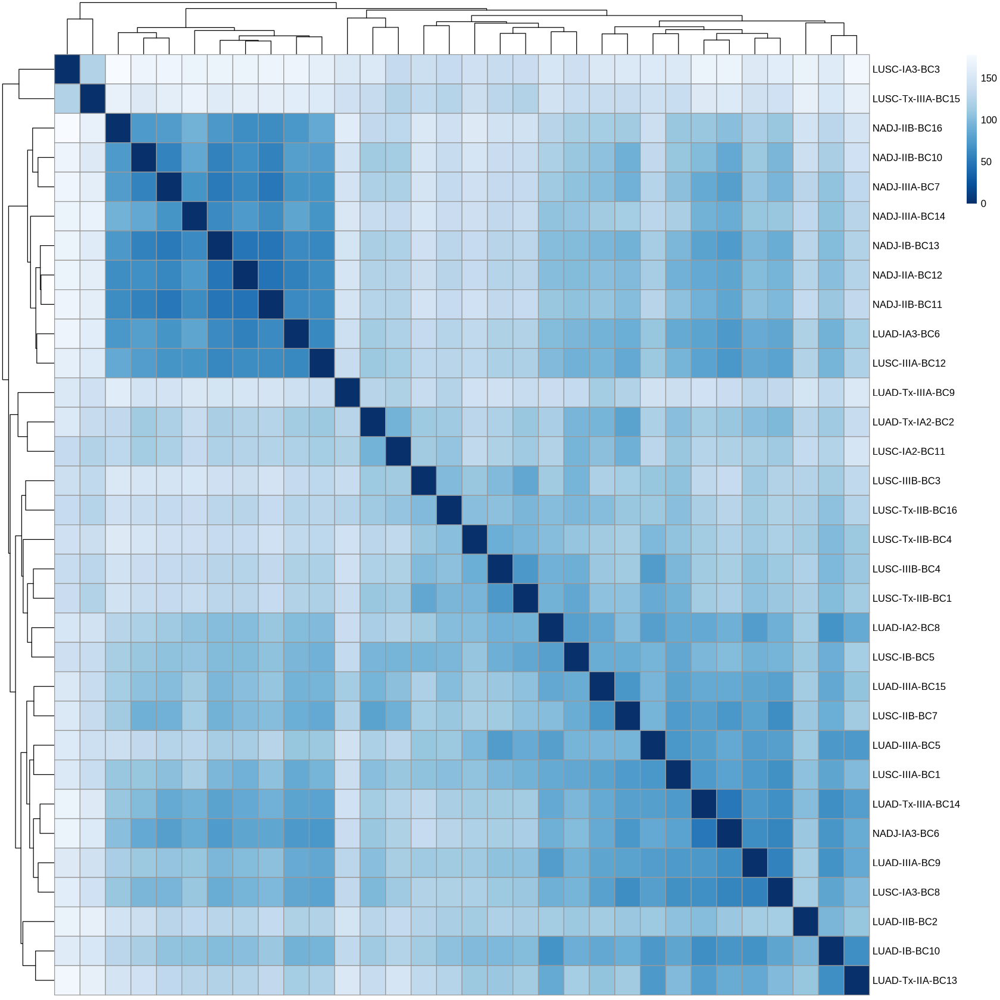

In [16]:
# heatmap of sample distances
rld <- rlog(dds)

sampleDists <- dist(t(assay(rld)))

sampleDistMatrix <- as.matrix( sampleDists )
rownames(sampleDistMatrix) <- colnames(rld)
colnames(sampleDistMatrix) <- NULL 
colors <- colorRampPalette( rev(brewer.pal(9, "Blues")) )(255)
pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         col = colors)

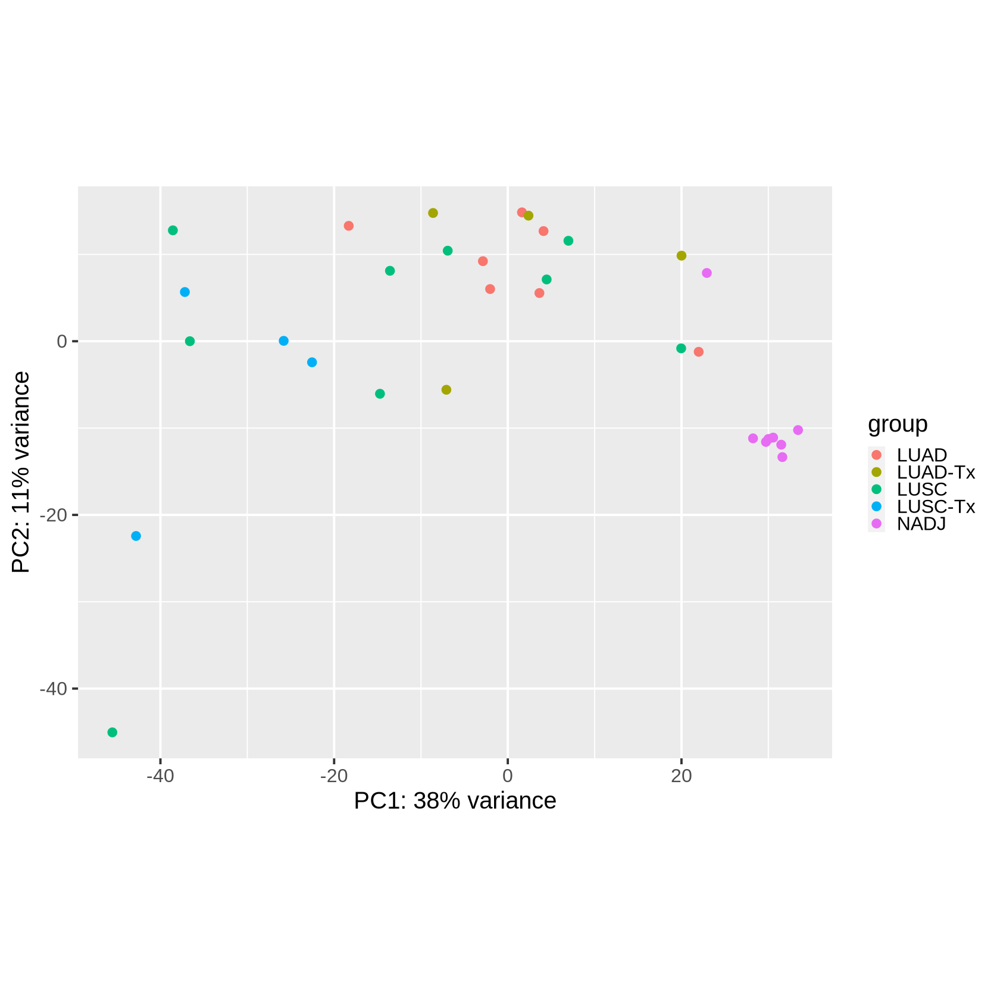

In [17]:
# PCA plot
object <- rld
ntop <- 500 # number of variable genes to use for PCA
intgroup <- 'condition'
pcsToUse = 1:2

rv <- rowVars(assay(object))
select <- order(rv, decreasing = TRUE)[seq_len(min(ntop, length(rv)))]
pca <- prcomp(t(assay(object)[select, ]))
percentVar <- pca$sdev^2/sum(pca$sdev^2)

intgroup.df <- as.data.frame(colData(object)[, intgroup, drop = FALSE])
group <- colData(object)[[intgroup]]

pcs <- paste0("PC", pcsToUse)
d <- data.frame(V1 = pca$x[, pcsToUse[1]], V2 = pca$x[, pcsToUse[2]], 
                group = group, intgroup.df, name = colnames(object))
colnames(d)[1:2] <- pcs

ggplot(data = d, aes(x = PC1, y = PC2, color = group)) + 
    geom_point(size = 4) + 
    xlab(paste0(pcs[1], ": ", round(percentVar[pcsToUse[1]] * 100), "% variance")) + 
    ylab(paste0(pcs[2], ": ", round(percentVar[pcsToUse[2]] * 100), "% variance")) + 
    coord_fixed() + 
    theme_gray(base_size = 24)

Other than the clustering together of the NADJ cells, no clear patterns emerge from either the heatmap or the PCA plot.

## differential expression analysis

In [18]:
# differential expression analysis
dds <- DESeq(dds)
dds

estimating size factors

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

final dispersion estimates

fitting model and testing

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  fo

class: DESeqDataSet 
dim: 16303 32 
metadata(1): version
assays(6): counts mu ... replaceCounts replaceCooks
rownames(16303): SAMD11 NOC2L ... MT-ND6 MT-CYB
rowData names(35): baseMean baseVar ... maxCooks replace
colnames(32): LUAD-IA2-BC8 LUAD-IA3-BC6 ... NADJ-IIIA-BC14
  NADJ-IIIA-BC7
colData names(3): condition sizeFactor replaceable

In [48]:
res <- results(dds)
summary(res)
res


out of 16303 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)       : 2033, 12%
LFC < 0 (down)     : 2507, 15%
outliers [1]       : 137, 0.84%
low counts [2]     : 0, 0%
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



log2 fold change (MLE): condition NADJ vs LUAD 
Wald test p-value: condition NADJ vs LUAD 
DataFrame with 16303 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat      pvalue        padj
        <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
SAMD11   433.7955      -0.681523  0.503806 -1.352749 0.176135900  0.33773134
NOC2L   2279.7745       0.193390  0.224719  0.860586 0.389466366  0.56711523
KLHL17  1099.8950      -0.210579  0.348688 -0.603919 0.545897563  0.70529534
PLEKHN1  888.0957      -1.219242  0.489036 -2.493151 0.012661507  0.05849117
PERM1     39.2272       2.005662  0.596716  3.361164 0.000776148  0.00859987
...           ...            ...       ...       ...         ...         ...
MT-ND4L  14210.94       -1.46441  0.323998  -4.51981 6.18951e-06 3.07640e-04
MT-ND4   26598.11       -2.84193  0.493873  -5.75438 8.69607e-09 3.34716e-06
MT-ND5    6073.39       -2.30849  0.503327  -4.58646 4.50835e-06 2.50454e-04
MT-ND6   70577.62     

In [63]:
# using more stringent thresholds: BH FDR adjusted p-value 0.05 vs 0.1
res <- results(dds, alpha = 0.05)
summary(res)
res


out of 16303 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1415, 8.7%
LFC < 0 (down)     : 1832, 11%
outliers [1]       : 137, 0.84%
low counts [2]     : 0, 0%
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



log2 fold change (MLE): condition NADJ vs LUAD 
Wald test p-value: condition NADJ vs LUAD 
DataFrame with 16303 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat      pvalue        padj
        <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
SAMD11   433.7955      -0.681523  0.503806 -1.352749 0.176135900  0.33773134
NOC2L   2279.7745       0.193390  0.224719  0.860586 0.389466366  0.56711523
KLHL17  1099.8950      -0.210579  0.348688 -0.603919 0.545897563  0.70529534
PLEKHN1  888.0957      -1.219242  0.489036 -2.493151 0.012661507  0.05849117
PERM1     39.2272       2.005662  0.596716  3.361164 0.000776148  0.00859987
...           ...            ...       ...       ...         ...         ...
MT-ND4L  14210.94       -1.46441  0.323998  -4.51981 6.18951e-06 3.07640e-04
MT-ND4   26598.11       -2.84193  0.493873  -5.75438 8.69607e-09 3.34716e-06
MT-ND5    6073.39       -2.30849  0.503327  -4.58646 4.50835e-06 2.50454e-04
MT-ND6   70577.62     

In [64]:
# significant genes with strongest down-regulation in NADJ
resSig <- subset(res, padj < 0.05)
head(resSig[ order(resSig$log2FoldChange), ])

log2 fold change (MLE): condition NADJ vs LUAD 
Wald test p-value: condition NADJ vs LUAD 
DataFrame with 6 rows and 6 columns
          baseMean log2FoldChange     lfcSE      stat      pvalue        padj
         <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
SPRR2E     8.35502      -25.46935  2.342740 -10.87161 1.57406e-27 2.54462e-23
SPRR1B   458.47772       -8.25600  1.440096  -5.73295 9.86973e-09 3.62623e-06
MMP13    790.70214       -8.17280  1.021410  -8.00149 1.22920e-15 3.97423e-12
PAX7      44.88256       -7.98151  1.629808  -4.89721 9.72068e-07 8.97596e-05
A2ML1    138.46412       -7.31625  1.424191  -5.13713 2.78971e-07 3.72715e-05
SPP1   22935.70228       -7.30798  0.879252  -8.31159 9.44268e-17 5.08835e-13

In [65]:
# significant genes with strongest up-regulation in NADJ
head(resSig[ order(resSig$log2FoldChange, decreasing = TRUE), ])

log2 fold change (MLE): condition NADJ vs LUAD 
Wald test p-value: condition NADJ vs LUAD 
DataFrame with 6 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat      pvalue        padj
        <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
CLEC4M  166.62403        6.76344   1.19719   5.64943 1.60985e-08 5.31120e-06
CDH16    18.77741        5.14150   0.96595   5.32274 1.02219e-07 2.14606e-05
SLC6A4 1602.14551        4.86331   1.20405   4.03911 5.36535e-05 1.38778e-03
HELT     11.56360        4.66740   1.04903   4.44926 8.61662e-06 3.84796e-04
DGKK      5.74979        4.50814   1.38622   3.25212 1.14548e-03 1.12161e-02
TBL1Y   104.09172        4.38477   1.57359   2.78648 5.32842e-03 3.25144e-02

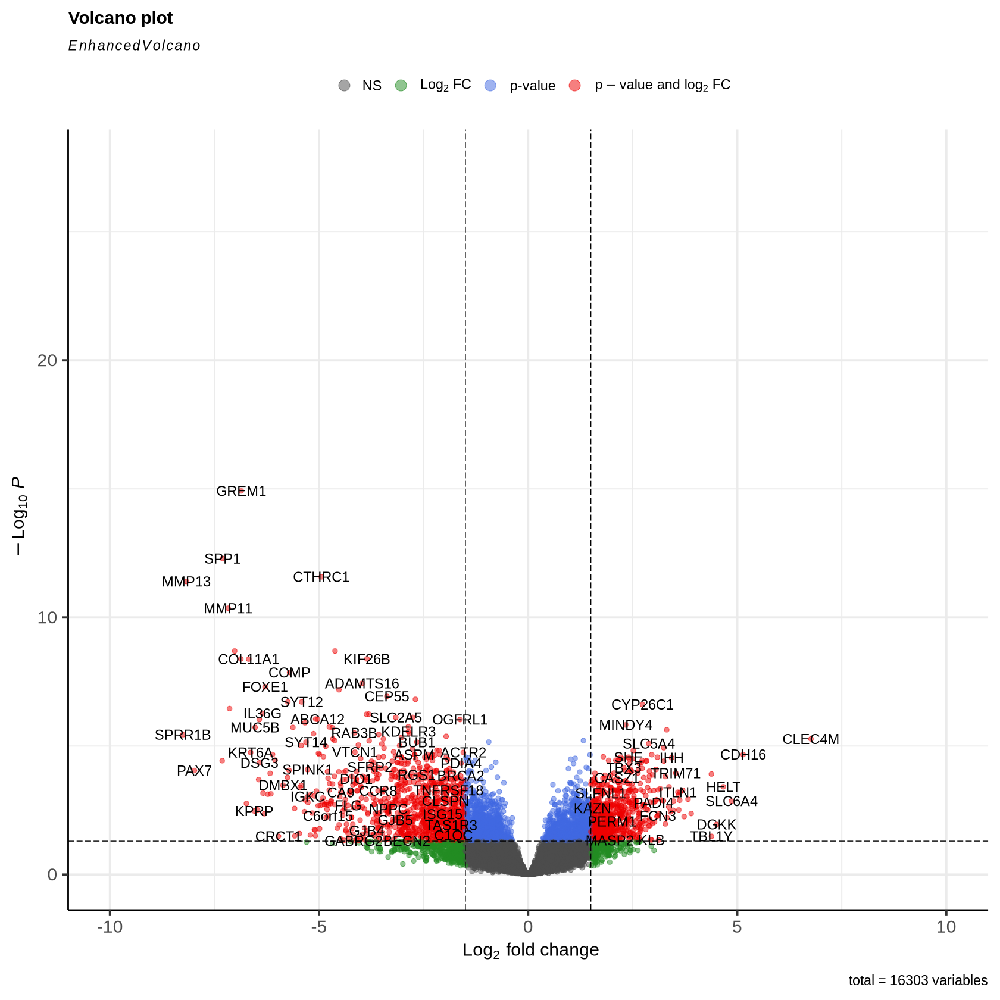

In [66]:
EnhancedVolcano(as.data.frame(res), x = 'log2FoldChange', y = 'padj', 
                lab = rownames(res), 
               pCutoff = 0.05, FCcutoff = 1.5, 
               xlim = c(-10, 10))

In [67]:
res[c('AGER', 'EMP2'),]

log2 fold change (MLE): condition NADJ vs LUAD 
Wald test p-value: condition NADJ vs LUAD 
DataFrame with 2 rows and 6 columns
      baseMean log2FoldChange     lfcSE      stat     pvalue      padj
     <numeric>      <numeric> <numeric> <numeric>  <numeric> <numeric>
AGER   12247.6        1.70476  0.621273   2.74397 0.00607004 0.0355666
EMP2   10128.3        1.79480  0.650439   2.75937 0.00579133 0.0344581

In [68]:
# compare NADJ to LUSC
res <- results(dds, alpha = 0.05, 
               contrast = c("condition", "NADJ", "LUSC"))
summary(res)
res


out of 16303 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1660, 10%
LFC < 0 (down)     : 2926, 18%
outliers [1]       : 137, 0.84%
low counts [2]     : 0, 0%
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



log2 fold change (MLE): condition NADJ vs LUSC 
Wald test p-value: condition NADJ vs LUSC 
DataFrame with 16303 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat      pvalue        padj
        <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
SAMD11   433.7955      -0.364878  0.466774 -0.781703 4.34389e-01 0.594962141
NOC2L   2279.7745      -0.336687  0.206945 -1.626945 1.03749e-01 0.219380056
KLHL17  1099.8950      -0.844994  0.321651 -2.627048 8.61293e-03 0.034387895
PLEKHN1  888.0957      -1.802053  0.453349 -3.974983 7.03844e-05 0.000820948
PERM1     39.2272       1.242017  0.540102  2.299598 2.14710e-02 0.068125660
...           ...            ...       ...       ...         ...         ...
MT-ND4L  14210.94      -0.841548  0.303738 -2.770637 5.59468e-03 2.47249e-02
MT-ND4   26598.11      -1.217122  0.463596 -2.625392 8.65493e-03 3.45045e-02
MT-ND5    6073.39      -0.453398  0.472204 -0.960175 3.36967e-01 5.01752e-01
MT-ND6   70577.62     

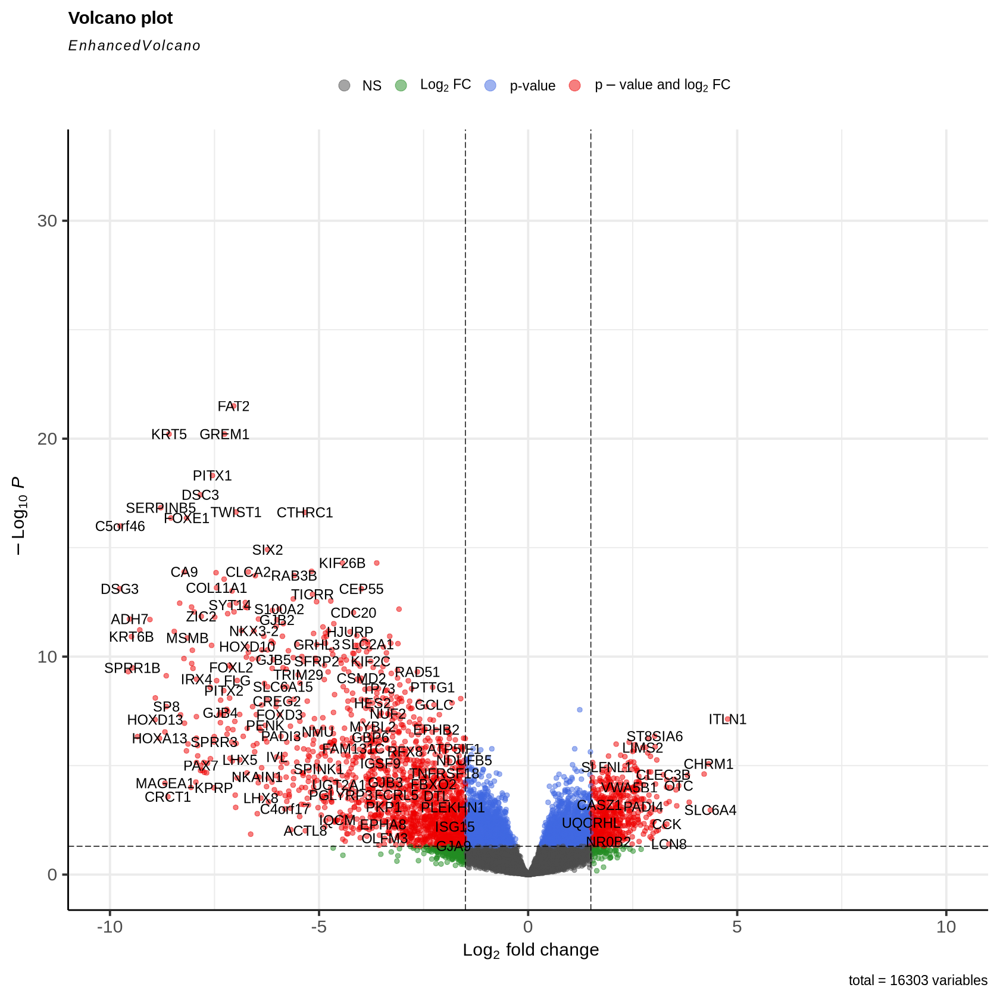

In [69]:
EnhancedVolcano(as.data.frame(res), x = 'log2FoldChange', y = 'padj', 
                lab = rownames(res), 
               pCutoff = 0.05, FCcutoff = 1.5, 
               xlim = c(-10, 10))

In [70]:
res[c('AGER', 'EMP2'),]

log2 fold change (MLE): condition NADJ vs LUSC 
Wald test p-value: condition NADJ vs LUSC 
DataFrame with 2 rows and 6 columns
      baseMean log2FoldChange     lfcSE      stat      pvalue        padj
     <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
AGER   12247.6        1.93027  0.582796   3.31208 9.26054e-04 0.006094182
EMP2   10128.3        2.56706  0.610142   4.20732 2.58417e-05 0.000363583

---

We see that the tumor suppressor genes AGER and EMP2 are upregulated in normal adjacent cells compared to both lung adenocarcinoma and lung squamous cell cancer.

### NEXT:

- pseudobulk analysis of AT1 and AT2 cells which are thought to be the cells of origin of lung adenocarcinoma
- gene set enrichment analysis (GSEA) comparing the 5 biological conditions

In [9]:
# Explicitly close multisession workers by switching plan
plan(sequential)
plan()

sequential:
- args: function (..., envir = parent.frame())
- tweaked: FALSE
- call: plan(sequential)

In [29]:
sessionInfo()

R version 4.3.2 (2023-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/fmbuga/.conda/envs/seurat5/lib/libopenblasp-r0.3.24.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: US/Pacific
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] ggplot2_3.4.4               RColorBrewer_1.1-3         
 [3] pheatmap_1.0.12             DESeq2_1.42.0              
 [5] SummarizedExperiment_1.32.0 Biobase_2.62.0             
 [7] MatrixGenerics_1.14.0    